In [1]:
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline
import os
import torch
import torch.optim
import torch.nn as nn
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from torchvision import transforms
device = 'cuda' if torch.cuda.is_available() else 'cpu'

from models.skip import skip
from models.unet import UNet
from models.cnn import CNN_Model
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

In [2]:
# image parameters
clean_image_path = './images/F16_GT.png'
noisy_beta = 0.05

# Whether combine DDPM
# True for DIP with DDPM, False for DIP without DDPM
with_ddpm = True

# DIP parameters
num_iter = 1000

# DDPM parameters
num_stages = 10
min_beta = noisy_beta
max_beta = 0.2 # must larger than noisy_beta

# Choose Models
# ['skip', 'unet', 'cnn']
model_name = 'skip'

# Other parameters
input_depth = 32
lr = 0.001
reg_noise_std = 1./30.

In [3]:
def load_image(filepath):
    image = Image.open(filepath).convert('RGB')
    transform = transforms.Compose([transforms.ToTensor()])
    return transform(image).unsqueeze(0).to(device)

In [4]:
clean_image = load_image(clean_image_path)

In [5]:
def ddpm_add_noise(image, beta):
    noise = torch.randn_like(image)
    beta_tensor = torch.tensor(beta, dtype=torch.float32, device=image.device)
    noisy_image = torch.sqrt(1 - beta_tensor) * image + torch.sqrt(beta_tensor) * noise
    return noisy_image.clamp(0, 1)

In [6]:
if with_ddpm:
    beta_levels = np.linspace(min_beta, max_beta, num_stages)
    noisy_images = [clean_image]
    for beta in beta_levels:
        noisy_images.append(ddpm_add_noise(clean_image, beta))
else:
    noisy_images = [ddpm_add_noise(clean_image, noisy_beta)]

In [7]:
def plot_ddpm_noisy_image():
    max_cols = 10
    num_rows = (num_stages + max_cols - 1) // max_cols
    fig, axs = plt.subplots(num_rows, max_cols, figsize=(20, num_rows*2))
    if num_rows > 1:
        axs = axs.flatten()
    for i in range(num_stages):
        axs[i].imshow(noisy_images[i+1].cpu().numpy().squeeze().transpose(1, 2, 0))
        axs[i].axis('off')
        axs[i].set_title(f'β={beta_levels[i]:.4f}')
    for j in range(i + 1, len(axs)):
        axs[j].axis('off')
    plt.show()

In [8]:
def plot_noisy_image():
    fig, axs = plt.subplots(1, 2, figsize=(20, 20))
    axs[0].imshow(clean_image.cpu().numpy().squeeze().transpose(1, 2, 0))
    axs[0].axis('off')
    axs[0].set_title(f'Original Image')
    axs[1].imshow(noisy_images[0].cpu().numpy().squeeze().transpose(1, 2, 0))
    axs[1].axis('off')
    axs[1].set_title(f'Noisy Image')
    plt.show()

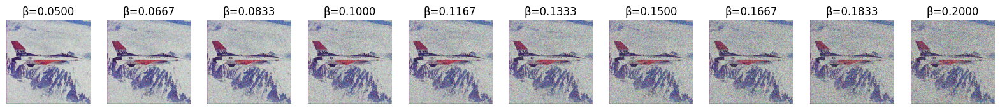

In [9]:
if with_ddpm:
    plot_ddpm_noisy_image()
    each_epoch = num_iter*beta_levels//sum(beta_levels)
    noisy_images.reverse()
else:
    plot_noisy_image()

In [10]:
if model_name == 'unet':
    model = UNet(input_depth, 3).type(dtype)
elif model_name == 'cnn':
    model = CNN_Model(input_depth, 3).type(dtype)
else:
    model = skip(input_depth, 3, num_channels_down = [128]*5 if isinstance(128, int) else 128,
                num_channels_up =   [128]*5 if isinstance(128, int) else 128,
                num_channels_skip = [4]*5 if isinstance(4, int) else 4, 
                upsample_mode='bilinear', downsample_mode='stride',
                need_sigmoid=True, need_bias=True, pad='reflection', act_fun='LeakyReLU').type(dtype)

In [11]:
# Loss function
mse = torch.nn.MSELoss().type(dtype)

# Input image
net_input = get_noise(input_depth, 'noise', (clean_image.shape[2], clean_image.shape[3])).type(dtype).detach()

In [12]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
psrn_noisy_last = 0

In [13]:
psnr_noisy, psnr_gt = [], []
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [14]:
def train_dip_with_ddpm():
    global net_input, net_input_saved, noise
    for stage in range(num_stages):
        best_psnr_noisy = 0
        best_psnr_gt = 0
        best_psnr_noisy_step = 0
        best_psnr_gt_step = 0
        for j in range(int(each_epoch[stage])):
            if reg_noise_std > 0:
                net_input = net_input_saved + (noise.normal_() * reg_noise_std)
            optimizer.zero_grad()
            out = model(net_input)
            total_loss = mse(out, noisy_images[stage])
            total_loss.backward()
            optimizer.step()

            psrn_noisy_val = psnr(noisy_images[stage].cpu().detach().numpy()[0], out.cpu().detach().numpy()[0])
            psrn_gt_val = psnr(clean_image.cpu().detach().numpy()[0], out.cpu().detach().numpy()[0])
            psnr_noisy.append(psrn_noisy_val)
            psnr_gt.append(psrn_gt_val)

            print(f'Stage {stage:02d} Iteration {j:05d}    Loss {total_loss.item():.4f}   PSNR_noisy: {psrn_noisy_val:.4f}   PSRN_gt: {psrn_gt_val:.4f}', end='\r')

            if psrn_noisy_val > best_psnr_noisy:
                best_psnr_noisy = psrn_noisy_val
                best_psnr_noisy_step = j
            if psrn_gt_val > best_psnr_gt:
                best_psnr_gt = psrn_gt_val
                best_psnr_gt_step = j
                out_np = np.clip(out.cpu().detach().numpy()[0], 0, 1)
                plt.imsave(f'best_psnr_gt_satge{stage}.png', out_np.transpose(1, 2, 0))

            if j % 100 == 0:
                out_np = np.clip(out.cpu().detach().numpy()[0], 0, 1)
                ground_truth = np.clip(noisy_images[stage].cpu().detach().numpy()[0], 0, 1)
                fig, axs = plt.subplots(1, 2, figsize=(12, 6))
                axs[0].imshow(out_np.transpose(1, 2, 0))
                axs[0].set_title('Output')
                axs[0].axis('off')
                axs[1].imshow(ground_truth.transpose(1, 2, 0))
                axs[1].set_title('Ground Truth')
                axs[1].axis('off')
                plt.show()
        print()
        print(f'Stage {stage:02d} Best PSNR_noisy: {best_psnr_noisy:.4f} at iteration {best_psnr_noisy_step:05d}')
        print(f'Stage {stage:02d} Best PSNR_gt: {best_psnr_gt:.4f} at iteration {best_psnr_gt_step:05d}')

In [15]:
def train_dip():
    global net_input, net_input_saved, noise
    best_psnr_noisy = 0
    best_psnr_gt = 0
    best_psnr_noisy_step = 0
    best_psnr_gt_step = 0
    for i in range(num_iter):
        if reg_noise_std > 0:
            net_input = net_input_saved + (noise.normal_() * reg_noise_std)
        optimizer.zero_grad()
        out = model(net_input)
        total_loss = mse(out, noisy_images[0])
        total_loss.backward()
        optimizer.step()

        psrn_noisy_val = psnr(noisy_images[0].cpu().detach().numpy()[0], out.cpu().detach().numpy()[0])
        psrn_gt_val = psnr(clean_image.cpu().detach().numpy()[0], out.cpu().detach().numpy()[0])
        psnr_noisy.append(psrn_noisy_val)
        psnr_gt.append(psrn_gt_val)

        print(f'Iteration {i:05d}    Loss {total_loss.item():.4f}   PSNR_noisy: {psrn_noisy_val:.4f}   PSRN_gt: {psrn_gt_val:.4f}', end='\r')

        if psrn_noisy_val > best_psnr_noisy:
            best_psnr_noisy = psrn_noisy_val
            best_psnr_noisy_step = i
        if psrn_gt_val > best_psnr_gt:
            best_psnr_gt = psrn_gt_val
            best_psnr_gt_step = i
            out_np = np.clip(out.cpu().detach().numpy()[0], 0, 1)
            plt.imsave(f'best_psnr_gt.png', out_np.transpose(1, 2, 0))


        if i % 100 == 0:
            out_np = np.clip(out.cpu().detach().numpy()[0], 0, 1)
            ground_truth = np.clip(noisy_images[0].cpu().detach().numpy()[0], 0, 1)
            fig, axs = plt.subplots(1, 2, figsize=(12, 6))
            axs[0].imshow(out_np.transpose(1, 2, 0))
            axs[0].set_title('Output')
            axs[0].axis('off')
            axs[1].imshow(ground_truth.transpose(1, 2, 0))
            axs[1].set_title('Ground Truth')
            axs[1].axis('off')
            plt.show()
    print()
    print(f'Best PSNR_noisy: {best_psnr_noisy:.4f} at iteration {best_psnr_noisy_step:05d}')
    print(f'Best PSNR_gt: {best_psnr_gt:.4f} at iteration {best_psnr_gt_step:05d}')

In [16]:
# plot psnr and psnr_gt in one graph
def plot_psnr():
    plt.figure(figsize=(10, 5))
    plt.plot(psnr_noisy, label='PSNR_noisy')
    plt.plot(psnr_gt, label='PSNR_gt')
    plt.xlabel('Iteration')
    plt.ylabel('PSNR')
    plt.legend()
    plt.show()

In [17]:
def evaluate():
    out = model(net_input)
    out_np = np.clip(out.cpu().detach().numpy()[0], 0, 1)
    plt.imsave('output_image.png', out_np.transpose(1, 2, 0))
    expected_output = np.clip(clean_image.cpu().detach().numpy()[0], 0, 1)
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(out_np.transpose(1, 2, 0))
    axs[0].set_title('Result')
    axs[0].axis('off')
    axs[1].imshow(expected_output.transpose(1, 2, 0))
    axs[1].set_title('Clean Image')
    axs[1].axis('off')
    plt.show()
    print(f'PSNR: {psnr(expected_output, out_np):.4f}')

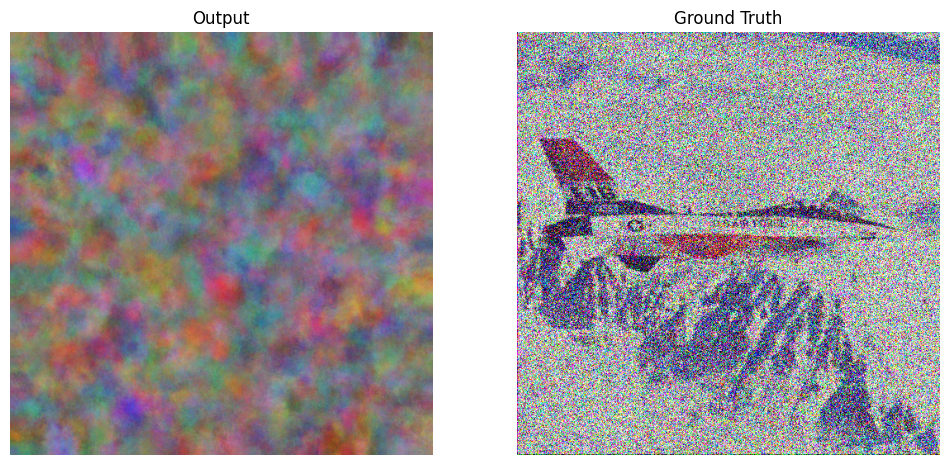

Stage 00 Iteration 00039    Loss 0.1108   PSNR_noisy: 9.5540   PSRN_gt: 15.8140
Stage 00 Best PSNR_noisy: 9.5540 at iteration 00039
Stage 00 Best PSNR_gt: 15.8700 at iteration 00018


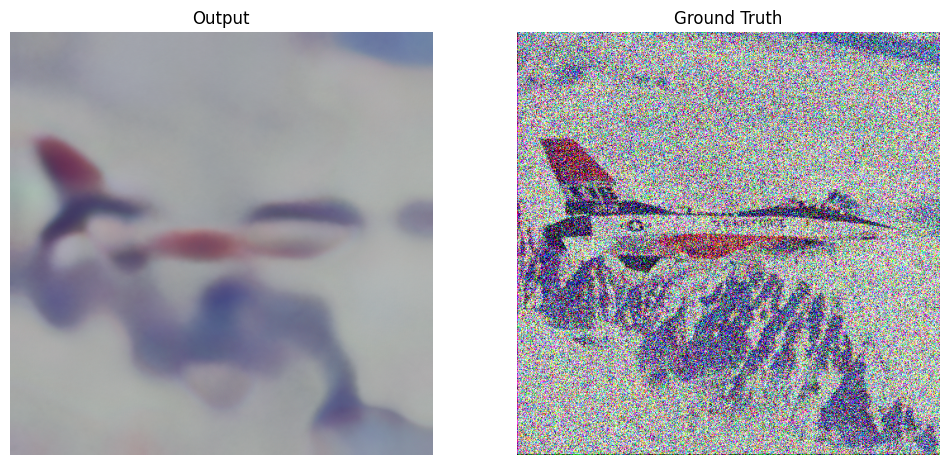

Stage 01 Iteration 00052    Loss 0.1044   PSNR_noisy: 9.8140   PSRN_gt: 16.5651
Stage 01 Best PSNR_noisy: 9.8171 at iteration 00051
Stage 01 Best PSNR_gt: 16.5994 at iteration 00049


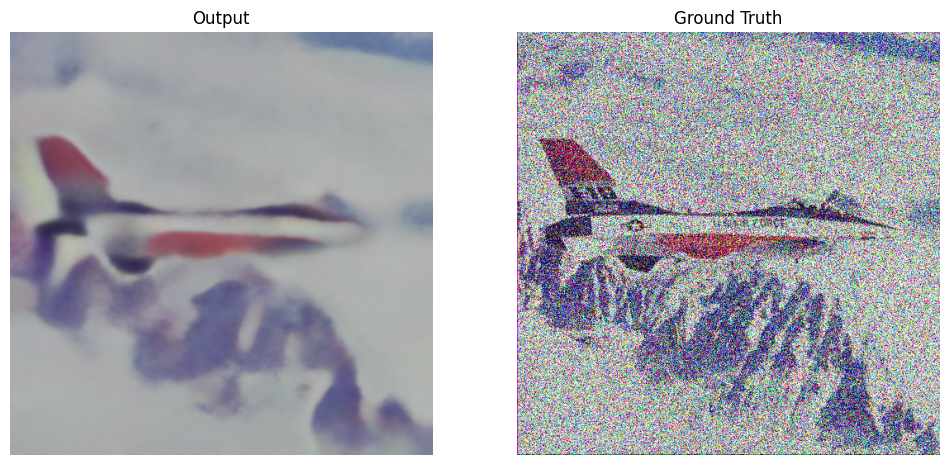

Stage 02 Iteration 00065    Loss 0.0976   PSNR_noisy: 10.1053   PSRN_gt: 17.4595
Stage 02 Best PSNR_noisy: 10.1053 at iteration 00065
Stage 02 Best PSNR_gt: 17.4996 at iteration 00064


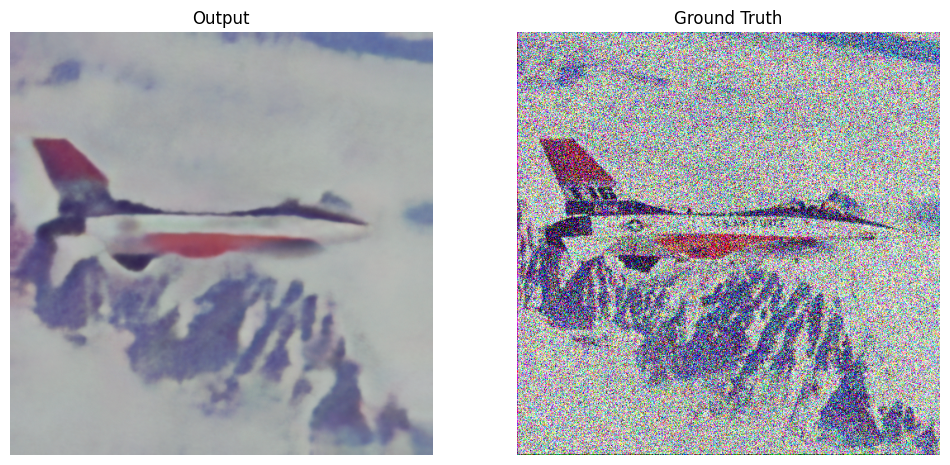

Stage 03 Iteration 00079    Loss 0.0908   PSNR_noisy: 10.4180   PSRN_gt: 18.1927
Stage 03 Best PSNR_noisy: 10.4184 at iteration 00075
Stage 03 Best PSNR_gt: 18.3007 at iteration 00069


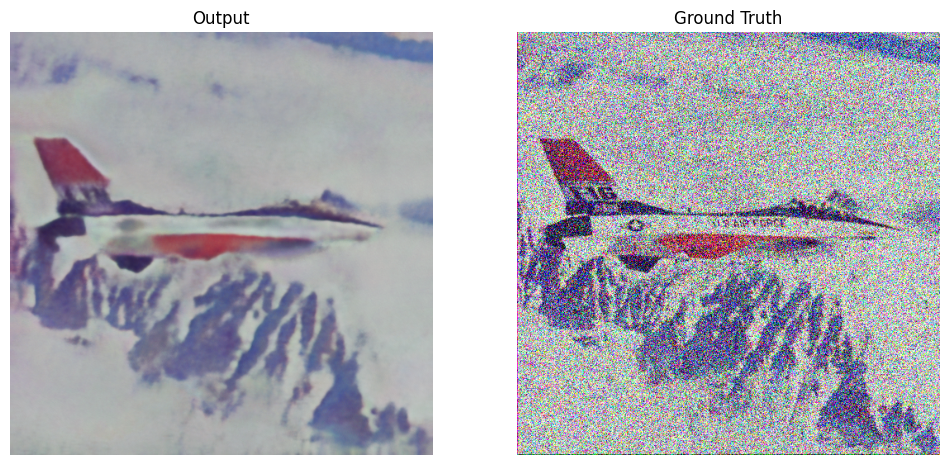

Stage 04 Iteration 00092    Loss 0.0838   PSNR_noisy: 10.7696   PSRN_gt: 19.0803
Stage 04 Best PSNR_noisy: 10.7696 at iteration 00092
Stage 04 Best PSNR_gt: 19.1302 at iteration 00090


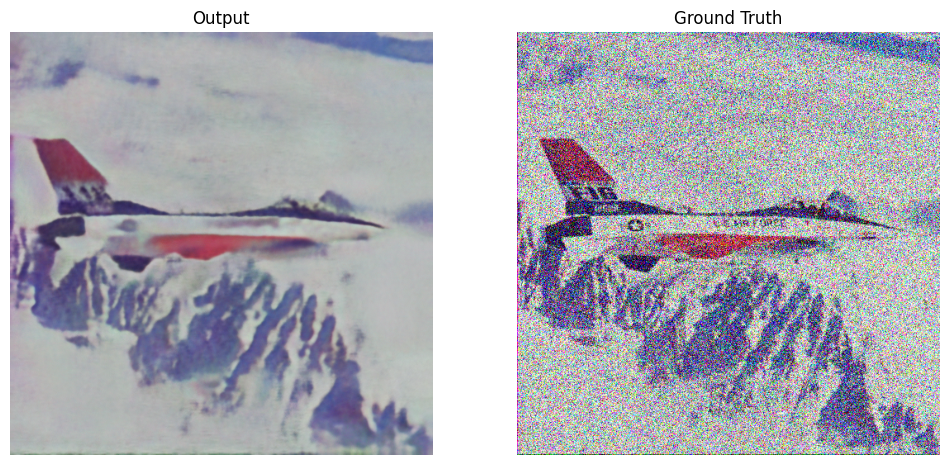

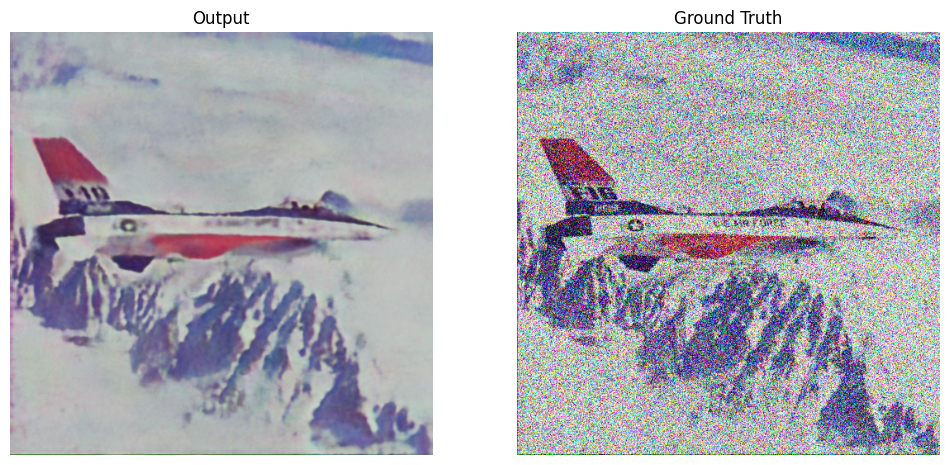

Stage 05 Iteration 00105    Loss 0.0758   PSNR_noisy: 11.2029   PSRN_gt: 20.0318
Stage 05 Best PSNR_noisy: 11.2057 at iteration 00102
Stage 05 Best PSNR_gt: 20.1818 at iteration 00092


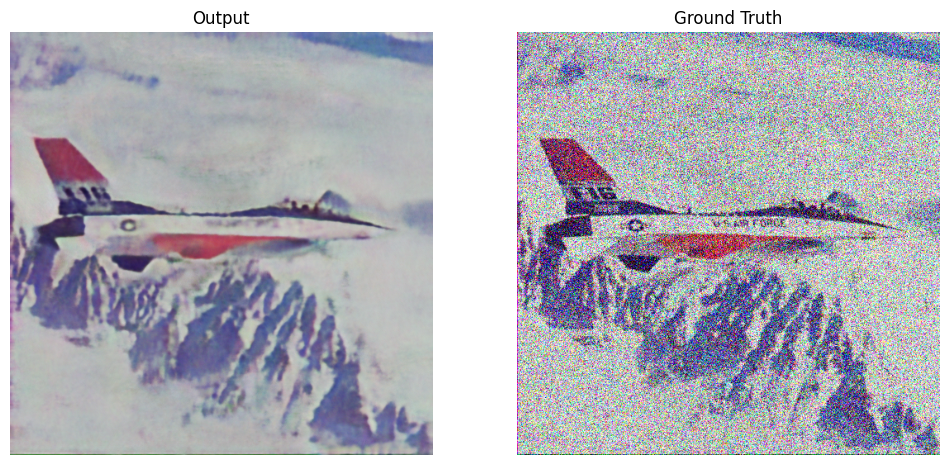

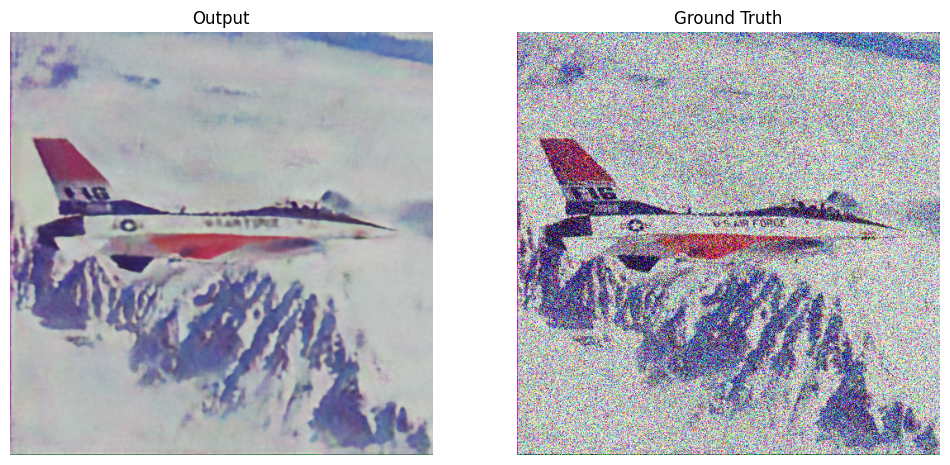

Stage 06 Iteration 00119    Loss 0.0675   PSNR_noisy: 11.7088   PSRN_gt: 21.1923
Stage 06 Best PSNR_noisy: 11.7088 at iteration 00119
Stage 06 Best PSNR_gt: 21.2320 at iteration 00115


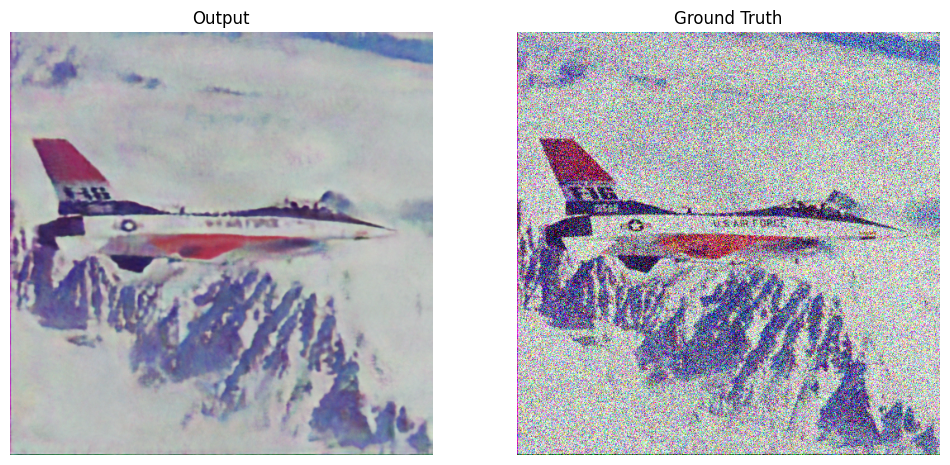

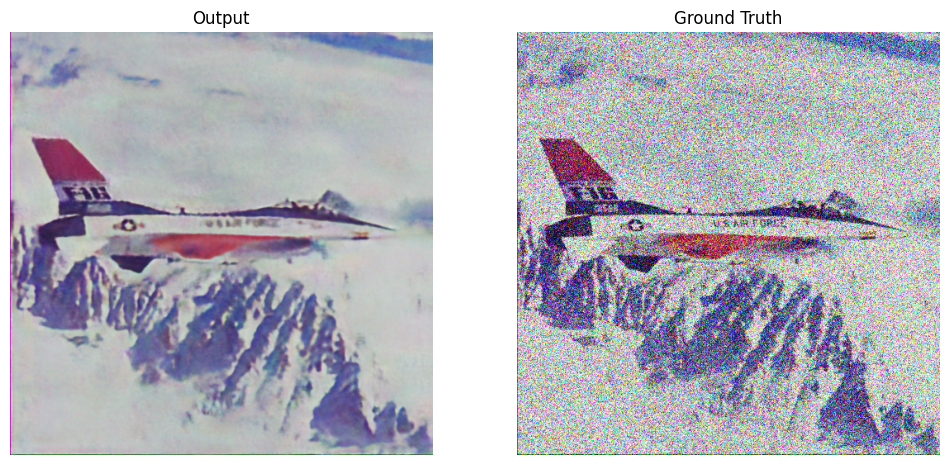

Stage 07 Iteration 00132    Loss 0.0584   PSNR_noisy: 12.3328   PSRN_gt: 22.3778
Stage 07 Best PSNR_noisy: 12.3352 at iteration 00129
Stage 07 Best PSNR_gt: 22.5390 at iteration 00051


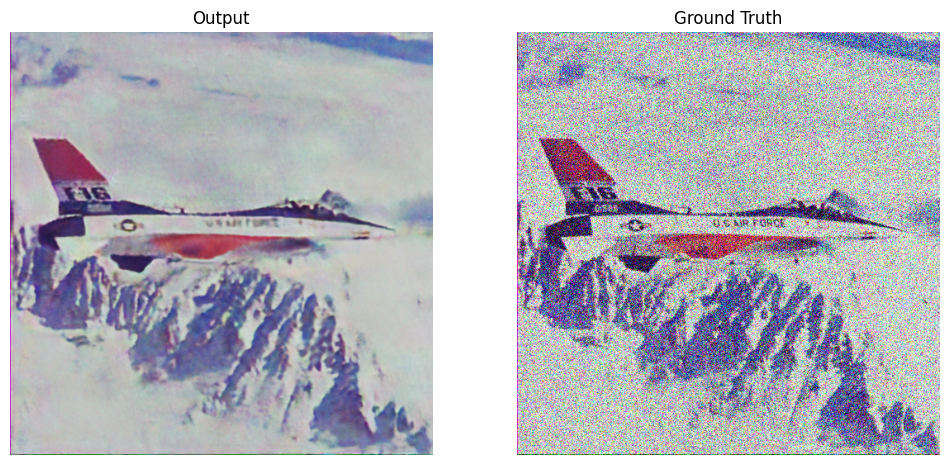

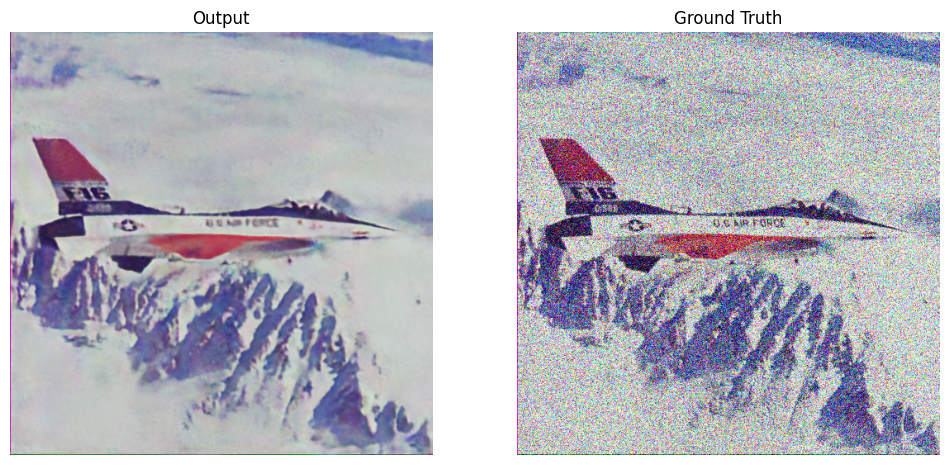

Stage 08 Iteration 00145    Loss 0.0488   PSNR_noisy: 13.1122   PSRN_gt: 23.6359
Stage 08 Best PSNR_noisy: 13.1137 at iteration 00144
Stage 08 Best PSNR_gt: 24.0201 at iteration 00008


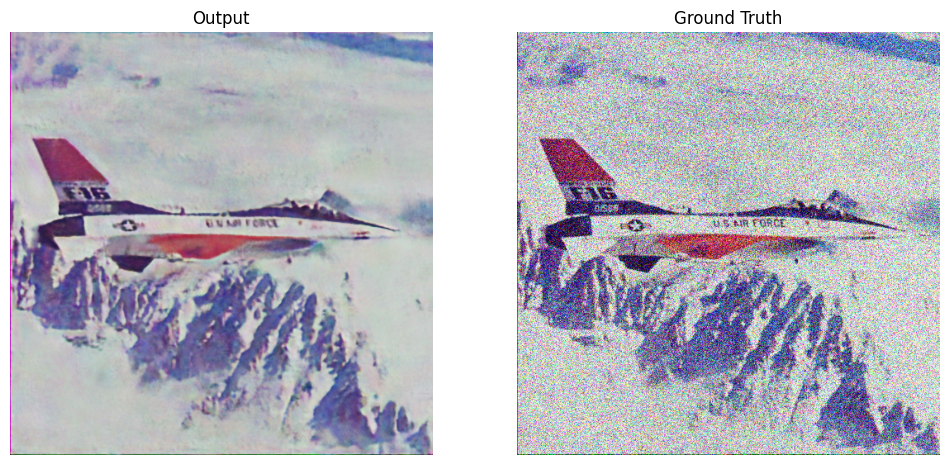

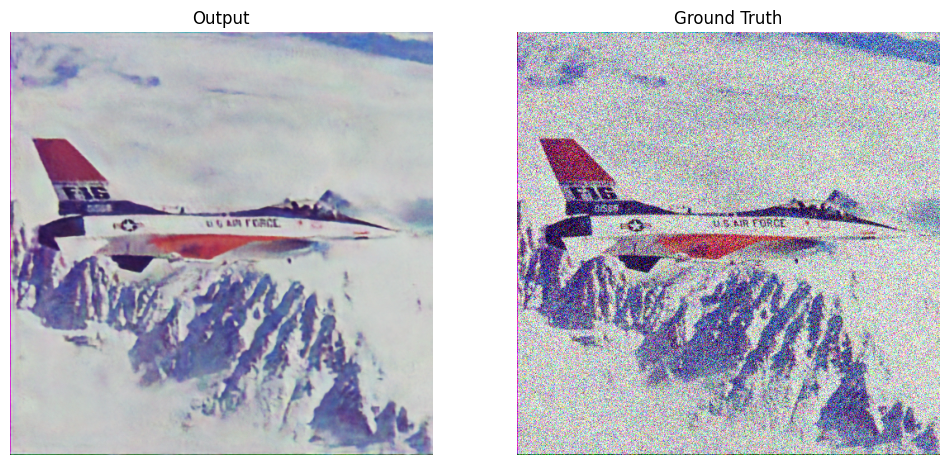

Stage 09 Iteration 00159    Loss 0.0386   PSNR_noisy: 14.1357   PSRN_gt: 25.1527
Stage 09 Best PSNR_noisy: 14.1376 at iteration 00158
Stage 09 Best PSNR_gt: 25.6964 at iteration 00049


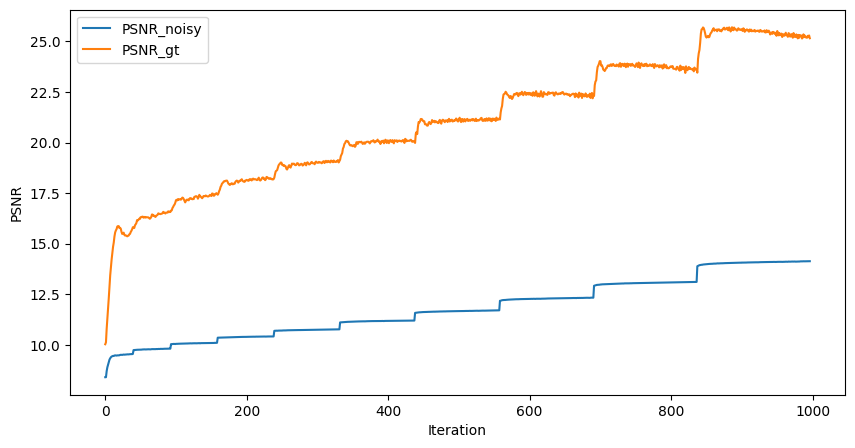

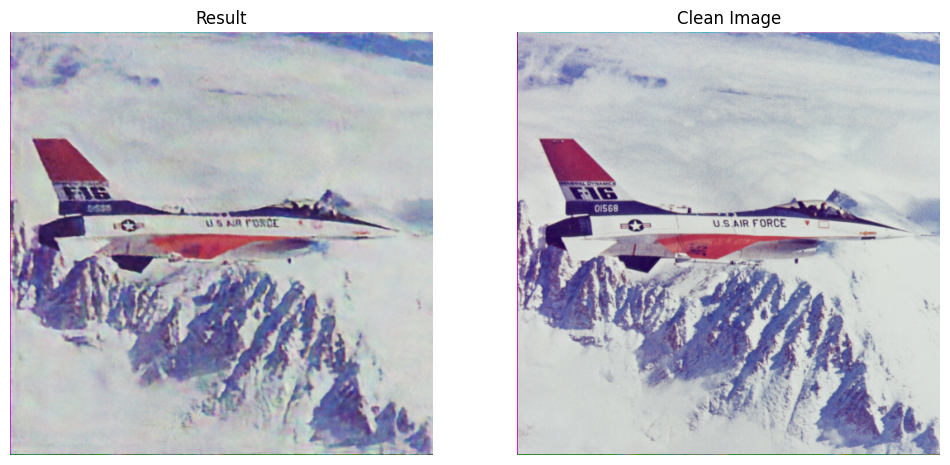

PSNR: 25.3346


In [18]:
if with_ddpm:
    train_dip_with_ddpm()
else:
    train_dip()
plot_psnr()
evaluate()